In [17]:
from pathlib import Path
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image

import rasterio
from rasterio.features import rasterize
from shapely.geometry import shape
from IPython.display import display

plt.rcParams["figure.figsize"] = (8, 8)
plt.rcParams["axes.grid"] = False

# Universal project root
PROJECT_ROOT = Path.cwd().resolve().parent if Path.cwd().name == "notebooks" else Path.cwd().resolve()

RAW_DIR = PROJECT_ROOT / "data" / "raw"
PRE_DIR = RAW_DIR / "PRE-event"
POST_DIR = RAW_DIR / "POST-event"
ANN_DIR = RAW_DIR / "annotations"
OUT_DIR = PROJECT_ROOT / "outputs" / "inspection"

OUT_DIR.mkdir(parents=True, exist_ok=True)

def to_rel_str(p):
    p = Path(p)
    try:
        return str(p.resolve().relative_to(PROJECT_ROOT.resolve())).replace("\\", "/")
    except Exception:
        return str(p).replace("\\", "/")

def to_abs_path(p):
    p = Path(p)
    if p.is_absolute():
        return p
    return (PROJECT_ROOT / p).resolve()

print("PROJECT_ROOT:", PROJECT_ROOT)
print("RAW_DIR:", RAW_DIR)
print("PRE_DIR exists:", PRE_DIR.exists())
print("POST_DIR exists:", POST_DIR.exists())
print("ANN_DIR exists:", ANN_DIR.exists())
print("OUT_DIR:", OUT_DIR)

assert RAW_DIR.exists(), f"RAW_DIR not found: {RAW_DIR}"
assert PRE_DIR.exists(), f"PRE_DIR not found: {PRE_DIR}"
assert POST_DIR.exists(), f"POST_DIR not found: {POST_DIR}"
assert ANN_DIR.exists(), f"ANN_DIR not found: {ANN_DIR}"

PROJECT_ROOT: C:\Users\Rajesh\Desktop\MSc-II\AI_FOR_SPACE\flood_project
RAW_DIR: C:\Users\Rajesh\Desktop\MSc-II\AI_FOR_SPACE\flood_project\data\raw
PRE_DIR exists: True
POST_DIR exists: True
ANN_DIR exists: True
OUT_DIR: C:\Users\Rajesh\Desktop\MSc-II\AI_FOR_SPACE\flood_project\outputs\inspection


In [18]:
pre_files = sorted(PRE_DIR.glob("*.tif"))
post_files = sorted(POST_DIR.glob("*.tif"))
ann_files = sorted(ANN_DIR.glob("*.geojson"))
mapping_files = sorted(RAW_DIR.glob("*_label_image_mapping.csv"))
reference_files = sorted(RAW_DIR.glob("*_reference.csv"))

print("PRE-event tif count:", len(pre_files))
print("POST-event tif count:", len(post_files))
print("Annotation geojson count:", len(ann_files))
print("Mapping CSV count:", len(mapping_files))
print("Reference CSV count:", len(reference_files))

print("\nExample PRE-event files:")
for f in pre_files[:5]:
    print("-", f.name)

print("\nExample POST-event files:")
for f in post_files[:5]:
    print("-", f.name)

print("\nExample annotation files:")
for f in ann_files[:5]:
    print("-", f.name)

assert len(pre_files) > 0, "No PRE-event tif files found"
assert len(post_files) > 0, "No POST-event tif files found"
assert len(ann_files) > 0, "No annotation GeoJSON files found"
assert len(mapping_files) > 0, "No mapping CSV found"

PRE-event tif count: 202
POST-event tif count: 282
Annotation geojson count: 202
Mapping CSV count: 1
Reference CSV count: 1

Example PRE-event files:
- 10500500C4DD7000_0_15_63.tif
- 10500500C4DD7000_0_15_65.tif
- 10500500C4DD7000_0_15_66.tif
- 10500500C4DD7000_0_15_67.tif
- 10500500C4DD7000_0_15_68.tif

Example POST-event files:
- 1040050035DC3B00_0_15_63.tif
- 1040050035DC3B00_0_15_65.tif
- 1040050035DC3B00_0_15_66.tif
- 1040050035DC3B00_0_15_67.tif
- 1040050035DC3B00_0_15_68.tif

Example annotation files:
- 0_15_63.geojson
- 0_15_65.geojson
- 0_15_66.geojson
- 0_15_67.geojson
- 0_15_68.geojson


In [19]:
mapping_df = pd.read_csv(mapping_files[0])

print("Mapping file used:", mapping_files[0].name)
print("Shape:", mapping_df.shape)
print("Columns:")
for c in mapping_df.columns:
    print("-", c)

display(mapping_df.head(10))

Mapping file used: Germany_Training_Public_label_image_mapping.csv
Shape: (202, 4)
Columns:
- label
- pre-event image
- post-event image 1
- post-event image 2


,label,pre-event image,post-event image 1,post-event image 2
0,0_41_59.geojson,10500500C4DD7000_0_41_59.tif,10500500E6DD3C00_0_41_59.tif,NaN
1,0_45_64.geojson,10500500C4DD7000_0_45_64.tif,10500500E6DD3C00_0_45_64.tif,NaN
2,0_32_59.geojson,10500500C4DD7000_0_32_59.tif,10500500E6DD3C00_0_32_59.tif,NaN
3,0_38_61.geojson,10500500C4DD7000_0_38_61.tif,10500500E6DD3C00_0_38_61.tif,NaN
4,0_36_60.geojson,10500500C4DD7000_0_36_60.tif,10500500E6DD3C00_0_36_60.tif,NaN
5,0_36_68.geojson,10500500C4DD7000_0_36_68.tif,10500500E6DD3C00_0_36_68.tif,NaN
6,0_45_68.geojson,10500500C4DD7000_0_45_68.tif,10500500E6DD3C00_0_45_68.tif,NaN
7,0_20_68.geojson,10500500C4DD7000_0_20_68.tif,10500500E6DD3C00_0_20_68.tif,1040050035DC3B00_0_20_68.tif
8,0_38_69.geojson,10500500C4DD7000_0_38_69.tif,10500500E6DD3C00_0_38_69.tif,NaN
9,0_29_70.geojson,10500500C4DD7000_0_29_70.tif,10500500E6DD3C00_0_29_70.tif,NaN


In [20]:
pre_lookup = {p.name: to_rel_str(p) for p in pre_files}
post_lookup = {p.name: to_rel_str(p) for p in post_files}
ann_lookup = {p.name: to_rel_str(p) for p in ann_files}

print("PRE lookup size:", len(pre_lookup))
print("POST lookup size:", len(post_lookup))
print("ANN lookup size:", len(ann_lookup))

PRE lookup size: 202
POST lookup size: 282
ANN lookup size: 202


In [21]:
def find_col(columns, keywords):
    for c in columns:
        c_low = c.lower()
        if all(k in c_low for k in keywords):
            return c
    return None

cols = list(mapping_df.columns)

pre_col = (
    find_col(cols, ["pre"]) or
    find_col(cols, ["pre", "image"]) or
    find_col(cols, ["image", "pre"])
)

post_col = (
    find_col(cols, ["post"]) or
    find_col(cols, ["post", "image"]) or
    find_col(cols, ["image", "post"])
)

label_col = (
    find_col(cols, ["label"]) or
    find_col(cols, ["annotation"]) or
    find_col(cols, ["geojson"]) or
    find_col(cols, ["mask"])
)

print("Detected PRE column :", pre_col)
print("Detected POST column:", post_col)
print("Detected LABEL column:", label_col)

assert pre_col is not None, "Could not detect PRE column"
assert post_col is not None, "Could not detect POST column"
assert label_col is not None, "Could not detect LABEL column"

Detected PRE column : pre-event image
Detected POST column: post-event image 1
Detected LABEL column: label


In [22]:
pairs_df = mapping_df.copy()

pairs_df["pre_name"] = pairs_df[pre_col].astype(str).apply(lambda x: Path(x).name)
pairs_df["post_name"] = pairs_df[post_col].astype(str).apply(lambda x: Path(x).name)
pairs_df["label_name"] = pairs_df[label_col].astype(str).apply(lambda x: Path(x).name)

pairs_df["pre_path"] = pairs_df["pre_name"].map(pre_lookup)
pairs_df["post_path"] = pairs_df["post_name"].map(post_lookup)
pairs_df["label_path"] = pairs_df["label_name"].map(ann_lookup)

display(pairs_df.head(10))

print("Rows with pre_path  :", pairs_df["pre_path"].notna().sum())
print("Rows with post_path :", pairs_df["post_path"].notna().sum())
print("Rows with label_path:", pairs_df["label_path"].notna().sum())

,label,pre-event image,post-event image 1,post-event image 2,pre_name,post_name,label_name,pre_path,post_path,label_path
0,0_41_59.geojson,10500500C4DD7000_0_41_59.tif,10500500E6DD3C00_0_41_59.tif,NaN,10500500C4DD7000_0_41_59.tif,10500500E6DD3C00_0_41_59.tif,0_41_59.geojson,data/raw/PRE-event/10500500C4DD7000_0_41_59.tif,data/raw/POST-event/10500500E6DD3C00_0_41_59.tif,data/raw/annotations/0_41_59.geojson
1,0_45_64.geojson,10500500C4DD7000_0_45_64.tif,10500500E6DD3C00_0_45_64.tif,NaN,10500500C4DD7000_0_45_64.tif,10500500E6DD3C00_0_45_64.tif,0_45_64.geojson,data/raw/PRE-event/10500500C4DD7000_0_45_64.tif,data/raw/POST-event/10500500E6DD3C00_0_45_64.tif,data/raw/annotations/0_45_64.geojson
2,0_32_59.geojson,10500500C4DD7000_0_32_59.tif,10500500E6DD3C00_0_32_59.tif,NaN,10500500C4DD7000_0_32_59.tif,10500500E6DD3C00_0_32_59.tif,0_32_59.geojson,data/raw/PRE-event/10500500C4DD7000_0_32_59.tif,data/raw/POST-event/10500500E6DD3C00_0_32_59.tif,data/raw/annotations/0_32_59.geojson
3,0_38_61.geojson,10500500C4DD7000_0_38_61.tif,10500500E6DD3C00_0_38_61.tif,NaN,10500500C4DD7000_0_38_61.tif,10500500E6DD3C00_0_38_61.tif,0_38_61.geojson,data/raw/PRE-event/10500500C4DD7000_0_38_61.tif,data/raw/POST-event/10500500E6DD3C00_0_38_61.tif,data/raw/annotations/0_38_61.geojson
4,0_36_60.geojson,10500500C4DD7000_0_36_60.tif,10500500E6DD3C00_0_36_60.tif,NaN,10500500C4DD7000_0_36_60.tif,10500500E6DD3C00_0_36_60.tif,0_36_60.geojson,data/raw/PRE-event/10500500C4DD7000_0_36_60.tif,data/raw/POST-event/10500500E6DD3C00_0_36_60.tif,data/raw/annotations/0_36_60.geojson
5,0_36_68.geojson,10500500C4DD7000_0_36_68.tif,10500500E6DD3C00_0_36_68.tif,NaN,10500500C4DD7000_0_36_68.tif,10500500E6DD3C00_0_36_68.tif,0_36_68.geojson,data/raw/PRE-event/10500500C4DD7000_0_36_68.tif,data/raw/POST-event/10500500E6DD3C00_0_36_68.tif,data/raw/annotations/0_36_68.geojson
6,0_45_68.geojson,10500500C4DD7000_0_45_68.tif,10500500E6DD3C00_0_45_68.tif,NaN,10500500C4DD7000_0_45_68.tif,10500500E6DD3C00_0_45_68.tif,0_45_68.geojson,data/raw/PRE-event/10500500C4DD7000_0_45_68.tif,data/raw/POST-event/10500500E6DD3C00_0_45_68.tif,data/raw/annotations/0_45_68.geojson
7,0_20_68.geojson,10500500C4DD7000_0_20_68.tif,10500500E6DD3C00_0_20_68.tif,1040050035DC3B00_0_20_68.tif,10500500C4DD7000_0_20_68.tif,10500500E6DD3C00_0_20_68.tif,0_20_68.geojson,data/raw/PRE-event/10500500C4DD7000_0_20_68.tif,data/raw/POST-event/10500500E6DD3C00_0_20_68.tif,data/raw/annotations/0_20_68.geojson
8,0_38_69.geojson,10500500C4DD7000_0_38_69.tif,10500500E6DD3C00_0_38_69.tif,NaN,10500500C4DD7000_0_38_69.tif,10500500E6DD3C00_0_38_69.tif,0_38_69.geojson,data/raw/PRE-event/10500500C4DD7000_0_38_69.tif,data/raw/POST-event/10500500E6DD3C00_0_38_69.tif,data/raw/annotations/0_38_69.geojson
9,0_29_70.geojson,10500500C4DD7000_0_29_70.tif,10500500E6DD3C00_0_29_70.tif,NaN,10500500C4DD7000_0_29_70.tif,10500500E6DD3C00_0_29_70.tif,0_29_70.geojson,data/raw/PRE-event/10500500C4DD7000_0_29_70.tif,data/raw/POST-event/10500500E6DD3C00_0_29_70.tif,data/raw/annotations/0_29_70.geojson


Rows with pre_path  : 202
Rows with post_path : 202
Rows with label_path: 202


In [23]:
valid_pairs = pairs_df[
    pairs_df["pre_path"].notna() &
    pairs_df["post_path"].notna() &
    pairs_df["label_path"].notna()
].copy()

print("Total rows in mapping file:", len(pairs_df))
print("Valid pairs found:", len(valid_pairs))

display(valid_pairs[["pre_name", "post_name", "label_name", "pre_path", "post_path", "label_path"]].head(10))

# Save only useful columns with universal relative paths
valid_pairs_out = valid_pairs[["pre_path", "post_path", "label_path"]].copy()
valid_pairs_out.to_csv(OUT_DIR / "valid_pairs.csv", index=False)

print("Saved:", OUT_DIR / "valid_pairs.csv")
assert len(valid_pairs) > 0, "No valid pairs found"

Total rows in mapping file: 202
Valid pairs found: 202


,pre_name,post_name,label_name,pre_path,post_path,label_path
0,10500500C4DD7000_0_41_59.tif,10500500E6DD3C00_0_41_59.tif,0_41_59.geojson,data/raw/PRE-event/10500500C4DD7000_0_41_59.tif,data/raw/POST-event/10500500E6DD3C00_0_41_59.tif,data/raw/annotations/0_41_59.geojson
1,10500500C4DD7000_0_45_64.tif,10500500E6DD3C00_0_45_64.tif,0_45_64.geojson,data/raw/PRE-event/10500500C4DD7000_0_45_64.tif,data/raw/POST-event/10500500E6DD3C00_0_45_64.tif,data/raw/annotations/0_45_64.geojson
2,10500500C4DD7000_0_32_59.tif,10500500E6DD3C00_0_32_59.tif,0_32_59.geojson,data/raw/PRE-event/10500500C4DD7000_0_32_59.tif,data/raw/POST-event/10500500E6DD3C00_0_32_59.tif,data/raw/annotations/0_32_59.geojson
3,10500500C4DD7000_0_38_61.tif,10500500E6DD3C00_0_38_61.tif,0_38_61.geojson,data/raw/PRE-event/10500500C4DD7000_0_38_61.tif,data/raw/POST-event/10500500E6DD3C00_0_38_61.tif,data/raw/annotations/0_38_61.geojson
4,10500500C4DD7000_0_36_60.tif,10500500E6DD3C00_0_36_60.tif,0_36_60.geojson,data/raw/PRE-event/10500500C4DD7000_0_36_60.tif,data/raw/POST-event/10500500E6DD3C00_0_36_60.tif,data/raw/annotations/0_36_60.geojson
5,10500500C4DD7000_0_36_68.tif,10500500E6DD3C00_0_36_68.tif,0_36_68.geojson,data/raw/PRE-event/10500500C4DD7000_0_36_68.tif,data/raw/POST-event/10500500E6DD3C00_0_36_68.tif,data/raw/annotations/0_36_68.geojson
6,10500500C4DD7000_0_45_68.tif,10500500E6DD3C00_0_45_68.tif,0_45_68.geojson,data/raw/PRE-event/10500500C4DD7000_0_45_68.tif,data/raw/POST-event/10500500E6DD3C00_0_45_68.tif,data/raw/annotations/0_45_68.geojson
7,10500500C4DD7000_0_20_68.tif,10500500E6DD3C00_0_20_68.tif,0_20_68.geojson,data/raw/PRE-event/10500500C4DD7000_0_20_68.tif,data/raw/POST-event/10500500E6DD3C00_0_20_68.tif,data/raw/annotations/0_20_68.geojson
8,10500500C4DD7000_0_38_69.tif,10500500E6DD3C00_0_38_69.tif,0_38_69.geojson,data/raw/PRE-event/10500500C4DD7000_0_38_69.tif,data/raw/POST-event/10500500E6DD3C00_0_38_69.tif,data/raw/annotations/0_38_69.geojson
9,10500500C4DD7000_0_29_70.tif,10500500E6DD3C00_0_29_70.tif,0_29_70.geojson,data/raw/PRE-event/10500500C4DD7000_0_29_70.tif,data/raw/POST-event/10500500E6DD3C00_0_29_70.tif,data/raw/annotations/0_29_70.geojson


Saved: C:\Users\Rajesh\Desktop\MSc-II\AI_FOR_SPACE\flood_project\outputs\inspection\valid_pairs.csv


In [28]:
def read_raster_meta(path_str):
    with rasterio.open(to_abs_path(path_str)) as src:
        return {
            "width": src.width,
            "height": src.height,
            "bands": src.count,
            "dtype": str(src.dtypes[0]),
            "crs": str(src.crs),
        }

meta_rows = []

for p in valid_pairs["pre_path"].head(20):
    try:
        meta = read_raster_meta(p)
        meta_rows.append({"path": p, "type": "pre", **meta})
    except Exception as e:
        meta_rows.append({"path": p, "type": "pre", "width": None, "height": None, "bands": None, "dtype": f"ERROR: {e}", "crs": None})

for p in valid_pairs["post_path"].head(20):
    try:
        meta = read_raster_meta(p)
        meta_rows.append({"path": p, "type": "post", **meta})
    except Exception as e:
        meta_rows.append({"path": p, "type": "post", "width": None, "height": None, "bands": None, "dtype": f"ERROR: {e}", "crs": None})

meta_df = pd.DataFrame(meta_rows)
display(meta_df.head(10))
display(meta_df.groupby("type")[["width", "height", "bands"]].agg(["min", "max", "median"]))

meta_df.to_csv(OUT_DIR / "image_metadata_summary.csv", index=False)
print("Saved:", OUT_DIR / "image_metadata_summary.csv")

,path,type,width,height,bands,dtype,crs
0,data/raw/PRE-event/10500500C4DD7000_0_41_59.tif,pre,1300,1300,3,uint8,EPSG:4326
1,data/raw/PRE-event/10500500C4DD7000_0_45_64.tif,pre,1300,1300,3,uint8,EPSG:4326
2,data/raw/PRE-event/10500500C4DD7000_0_32_59.tif,pre,1300,1300,3,uint8,EPSG:4326
3,data/raw/PRE-event/10500500C4DD7000_0_38_61.tif,pre,1300,1300,3,uint8,EPSG:4326
4,data/raw/PRE-event/10500500C4DD7000_0_36_60.tif,pre,1300,1300,3,uint8,EPSG:4326
5,data/raw/PRE-event/10500500C4DD7000_0_36_68.tif,pre,1300,1300,3,uint8,EPSG:4326
6,data/raw/PRE-event/10500500C4DD7000_0_45_68.tif,pre,1300,1300,3,uint8,EPSG:4326
7,data/raw/PRE-event/10500500C4DD7000_0_20_68.tif,pre,1300,1300,3,uint8,EPSG:4326
8,data/raw/PRE-event/10500500C4DD7000_0_38_69.tif,pre,1300,1300,3,uint8,EPSG:4326
9,data/raw/PRE-event/10500500C4DD7000_0_29_70.tif,pre,1300,1300,3,uint8,EPSG:4326


width               height               bands           
       min   max  median    min   max  median   min max median
type                                                          
post   785  1743   786.0    785  1742   786.0     3   3    3.0
pre   1300  1300  1300.0   1300  1300  1300.0     3   3    3.0

Saved: C:\Users\Rajesh\Desktop\MSc-II\AI_FOR_SPACE\flood_project\outputs\inspection\image_metadata_summary.csv


In [29]:
sample_label = to_abs_path(valid_pairs.iloc[0]["label_path"])

with open(sample_label, "r", encoding="utf-8") as f:
    label_json = json.load(f)

print("Sample label file:", sample_label.name)
print("Top-level keys:", list(label_json.keys()))
print("Number of features:", len(label_json.get("features", [])))

if label_json.get("features"):
    print("\nExample feature properties:")
    print(label_json["features"][0].get("properties", {}))

Sample label file: 0_41_59.geojson
Top-level keys: ['type', 'crs', 'features']
Number of features: 102

Example feature properties:
{'id': 'way/847401772', 'building': None, 'flooded': None, 'highway': 'residential', 'lanes': '2', 'surface': 'paved', 'oneway': None, 'bridge': None, 'layer': None, 'tunnel': None, 'type': None, 'image_id': '10500500C4DD7000', 'location': 'Germany_Training_Public'}


In [30]:
def percentile_stretch(arr):
    arr = arr.astype(np.float32)
    if arr.ndim == 2:
        lo, hi = np.percentile(arr, (2, 98))
        return np.clip((arr - lo) / (hi - lo + 1e-6), 0, 1)

    out = np.zeros_like(arr, dtype=np.float32)
    for c in range(arr.shape[2]):
        lo, hi = np.percentile(arr[:, :, c], (2, 98))
        out[:, :, c] = np.clip((arr[:, :, c] - lo) / (hi - lo + 1e-6), 0, 1)
    return out

def read_preview_rgb(path_str):
    with rasterio.open(to_abs_path(path_str)) as src:
        if src.count >= 3:
            arr = src.read([1, 2, 3])
            arr = np.transpose(arr, (1, 2, 0))
        else:
            arr = src.read(1)
    return percentile_stretch(arr)

def rasterize_preview_mask(label_path, ref_image_path):
    label_path = to_abs_path(label_path)
    ref_image_path = to_abs_path(ref_image_path)

    with rasterio.open(ref_image_path) as src:
        out_shape = (src.height, src.width)
        transform = src.transform

    with open(label_path, "r", encoding="utf-8") as f:
        data = json.load(f)

    shapes = []
    for feat in data.get("features", []):
        geom = feat.get("geometry")
        if geom is None:
            continue
        try:
            shapes.append((shape(geom), 1))
        except Exception:
            continue

    if not shapes:
        return np.zeros(out_shape, dtype=np.uint8)

    return rasterize(
        shapes=shapes,
        out_shape=out_shape,
        transform=transform,
        fill=0,
        dtype="uint8"
    )

def save_img(img, out_path, cmap=None):
    out_path = Path(out_path)
    out_path.parent.mkdir(parents=True, exist_ok=True)
    plt.figure(figsize=(6, 6))
    if img.ndim == 2:
        plt.imshow(img, cmap=cmap or "gray")
    else:
        plt.imshow(img)
    plt.axis("off")
    plt.tight_layout()
    plt.savefig(out_path, dpi=180, bbox_inches="tight", pad_inches=0)
    plt.close()

def save_overlay(rgb, mask, out_path, color=(0, 1, 1), alpha=0.35):
    if rgb.ndim == 2:
        rgb = np.stack([rgb] * 3, axis=-1)

    color = np.array(color, dtype=np.float32).reshape(1, 1, 3)
    overlay = np.where(mask[..., None] > 0, (1 - alpha) * rgb + alpha * color, rgb)
    overlay = np.clip(overlay, 0, 1)

    save_img(overlay, out_path)

In [31]:
saved_pre = []
saved_post = []
saved_mask = []
saved_overlay = []

sample_pairs = valid_pairs.head(10).copy()

for idx, row in enumerate(sample_pairs.itertuples(index=False), start=1):
    try:
        pre_img = read_preview_rgb(row.pre_path)
        post_img = read_preview_rgb(row.post_path)
        mask_img = rasterize_preview_mask(row.label_path, row.post_path)

        pre_out = OUT_DIR / f"pre_sample_{idx}.png"
        post_out = OUT_DIR / f"post_sample_{idx}.png"
        mask_out = OUT_DIR / f"mask_sample_{idx}.png"

        save_img(pre_img, pre_out)
        save_img(post_img, post_out)
        save_img(mask_img, mask_out, cmap="gray")

        saved_pre.append(pre_out)
        saved_post.append(post_out)
        saved_mask.append(mask_out)

        if idx <= 5:
            overlay_out = OUT_DIR / f"overlay_sample_{idx}.png"
            save_overlay(post_img, mask_img, overlay_out)
            saved_overlay.append(overlay_out)

    except Exception as e:
        print(f"Skipping sample {idx} due to error: {e}")

print("Saved PRE samples:", len(saved_pre))
print("Saved POST samples:", len(saved_post))
print("Saved MASK previews:", len(saved_mask))
print("Saved OVERLAYS:", len(saved_overlay))

Saved PRE samples: 10
Saved POST samples: 10
Saved MASK previews: 10
Saved OVERLAYS: 5


In [ ]:
def show_saved_images(title, paths, ncols=3):
    n = len(paths)
    if n == 0:
        print(f"No images found for: {title}")
        return

    nrows = int(np.ceil(n / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=(5 * ncols, 5 * nrows))
    axes = np.array(axes).reshape(-1)

    for ax in axes:
        ax.axis("off")

    for ax, path in zip(axes, paths):
        img = Image.open(path)
        ax.imshow(img)
        ax.set_title(Path(path).name)

    plt.suptitle(title, fontsize=14)
    plt.tight_layout()
    plt.show()

show_saved_images("Pre-event samples", saved_pre, ncols=3)
show_saved_images("Post-event samples", saved_post, ncols=3)
show_saved_images("Mask previews", saved_mask, ncols=3)
show_saved_images("Overlay previews", saved_overlay, ncols=3)

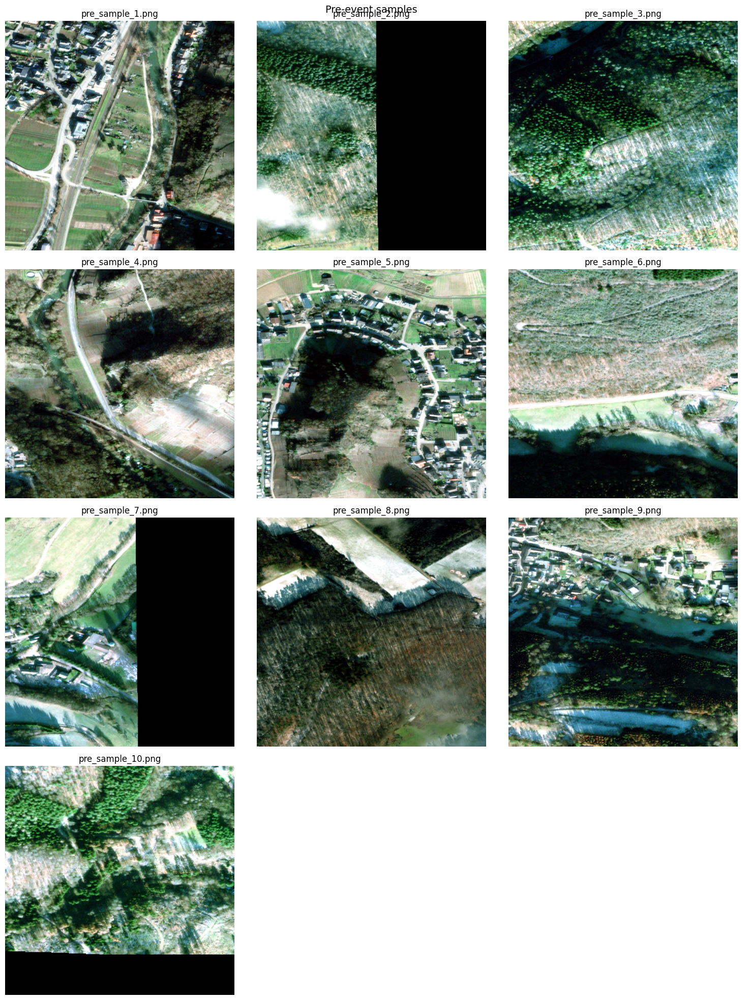

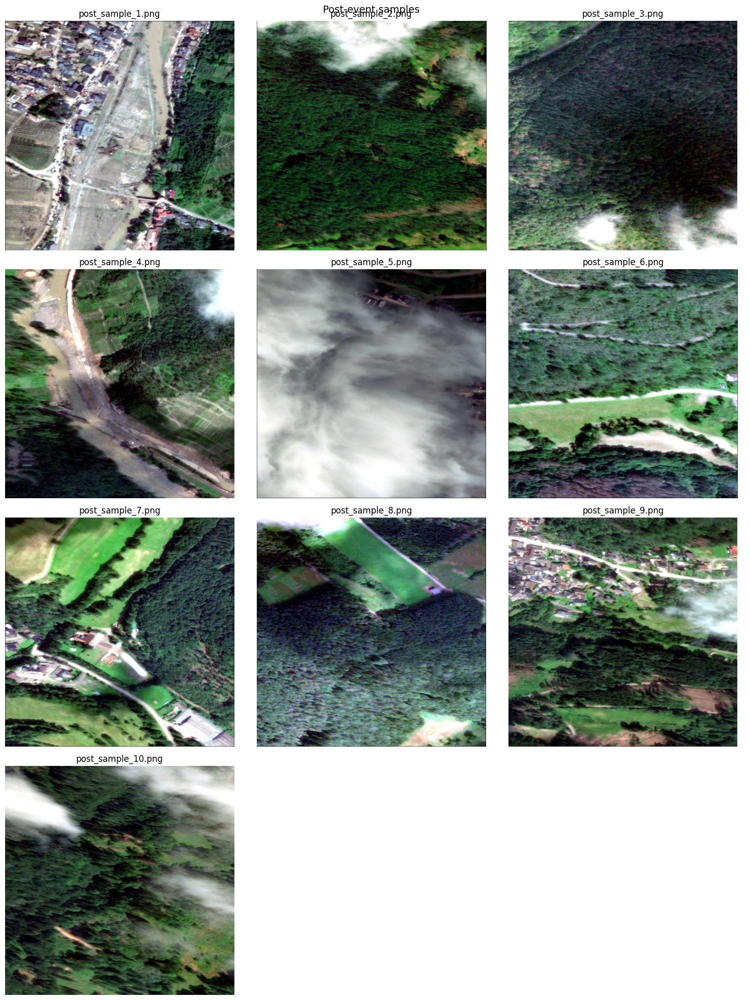

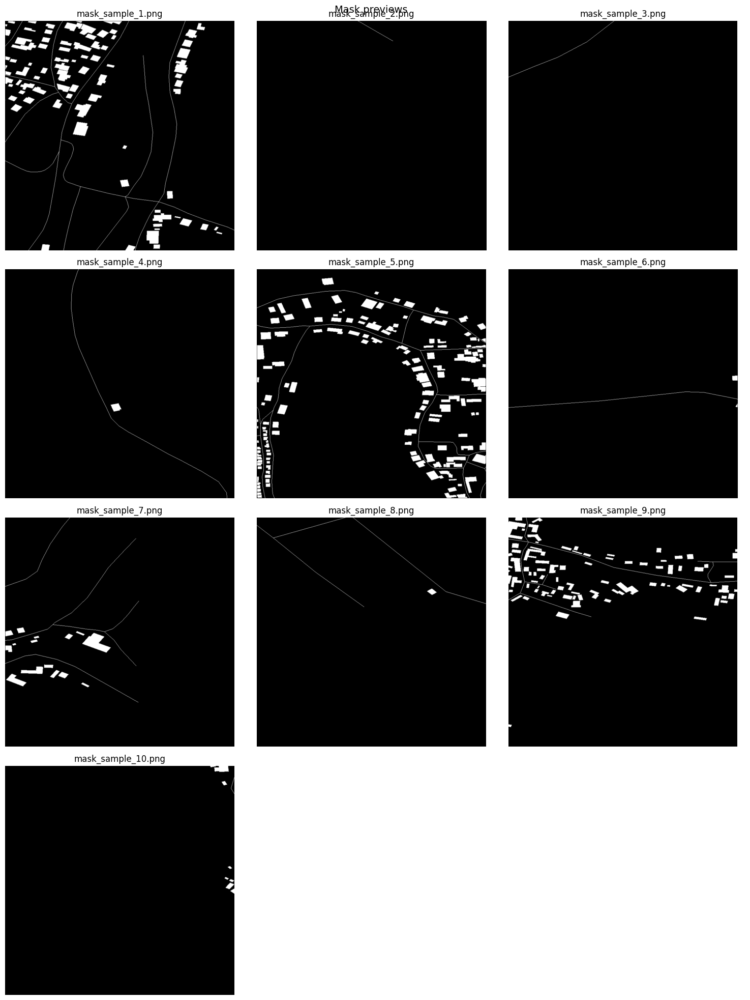

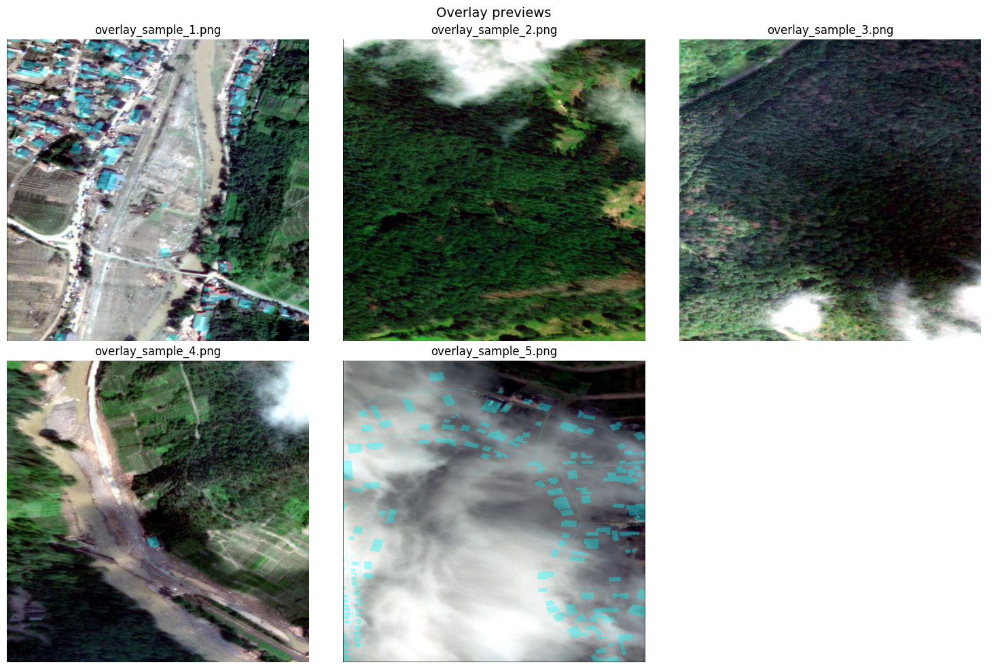

In [33]:
def show_saved_images(title, paths, ncols=3):
    n = len(paths)
    if n == 0:
        print(f"No images found for: {title}")
        return

    nrows = int(np.ceil(n / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=(5 * ncols, 5 * nrows))
    axes = np.array(axes).reshape(-1)

    for ax in axes:
        ax.axis("off")

    for ax, path in zip(axes, paths):
        img = Image.open(path)
        ax.imshow(img)
        ax.set_title(Path(path).name)

    plt.suptitle(title, fontsize=14)
    plt.tight_layout()
    plt.show()

show_saved_images("Pre-event samples", saved_pre, ncols=3)
show_saved_images("Post-event samples", saved_post, ncols=3)
show_saved_images("Mask previews", saved_mask, ncols=3)
show_saved_images("Overlay previews", saved_overlay, ncols=3)

In [34]:
def image_quality_stats(path_str):
    with rasterio.open(to_abs_path(path_str)) as src:
        arr = src.read(1).astype(np.float32)

    return {
        "mean": float(arr.mean()),
        "std": float(arr.std()),
        "min": float(arr.min()),
        "max": float(arr.max()),
        "height": int(arr.shape[0]),
        "width": int(arr.shape[1]),
        "zero_ratio": float((arr == 0).sum() / arr.size),
    }

quality_rows = []

for p in valid_pairs["post_path"].dropna().head(50):
    try:
        stats = image_quality_stats(p)
        quality_rows.append({"path": p, **stats, "status": "OK"})
    except Exception as e:
        quality_rows.append({
            "path": p,
            "mean": None,
            "std": None,
            "min": None,
            "max": None,
            "height": None,
            "width": None,
            "zero_ratio": None,
            "status": f"ERROR: {e}"
        })

quality_df = pd.DataFrame(quality_rows)

if quality_df.empty:
    print("No quality statistics could be generated.")
else:
    display(quality_df.describe(include="all"))

    quality_ok = quality_df[quality_df["status"] == "OK"].copy()

    if not quality_ok.empty:
        low_std = quality_ok[quality_ok["std"] < quality_ok["std"].quantile(0.05)].copy()
        high_zero = quality_ok[quality_ok["zero_ratio"] > quality_ok["zero_ratio"].quantile(0.95)].copy()

        print("Potentially low-detail / low-contrast images:", len(low_std))
        display(low_std.head(10))

        print("Potentially high empty/zero-content images:", len(high_zero))
        display(high_zero.head(10))

quality_df.to_csv(OUT_DIR / "quality_check_summary.csv", index=False)
print("Saved:", OUT_DIR / "quality_check_summary.csv")

,path,mean,std,min,max,height,width,zero_ratio,status
count,50,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000,50
unique,50,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
top,data/raw/POST-event/10500500E6DD3C00_0_41_59.tif,NaN,NaN,NaN,NaN,NaN,NaN,NaN,OK
freq,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,50
mean,NaN,56.969708,34.134798,0.080000,207.640000,996.160000,996.220000,0.038707,NaN
std,NaN,40.813342,18.407421,0.565685,54.841798,400.370051,400.581684,0.151313,NaN
min,NaN,2.159205,4.698910,0.000000,87.000000,785.000000,785.000000,0.000000,NaN
25%,NaN,33.621400,20.324995,0.000000,160.750000,785.250000,785.000000,0.002545,NaN
50%,NaN,45.821543,31.306538,0.000000,226.000000,786.000000,786.000000,0.003847,NaN
75%,NaN,69.302256,43.242449,0.000000,255.000000,786.000000,786.000000,0.005669,NaN


Potentially low-detail / low-contrast images: 3


,path,mean,std,min,max,height,width,zero_ratio,status
16,data/raw/POST-event/10500500E6DD3C00_0_43_62.tif,19.427248,8.107404,0.0,87.0,786,785,0.003126,OK
30,data/raw/POST-event/10500500E6DD3C00_0_39_63.tif,10.784863,4.698910,0.0,98.0,786,786,0.005766,OK
45,data/raw/POST-event/10500500E6DD3C00_0_27_64.tif,30.264780,11.591512,0.0,102.0,785,786,0.001274,OK


Potentially high empty/zero-content images: 3


,path,mean,std,min,max,height,width,zero_ratio,status
20,data/raw/POST-event/1040050035DC3B00_0_28_67.tif,53.083305,39.192989,0.0,255.0,1743,1743,0.174027,OK
27,data/raw/POST-event/10500500E6DD3C00_0_40_57.tif,2.159205,12.530141,0.0,224.0,786,785,0.964002,OK
42,data/raw/POST-event/10500500E6DD3C00_0_43_58.tif,32.169437,44.257862,0.0,255.0,785,785,0.477311,OK


Saved: C:\Users\Rajesh\Desktop\MSc-II\AI_FOR_SPACE\flood_project\outputs\inspection\quality_check_summary.csv


In [35]:
summary = {
    "PRE-event images": len(pre_files),
    "POST-event images": len(post_files),
    "Annotation files": len(ann_files),
    "Mapping CSVs": len(mapping_files),
    "Reference CSVs": len(reference_files),
    "Valid pairs": len(valid_pairs),
    "Saved PRE samples": len(saved_pre),
    "Saved POST samples": len(saved_post),
    "Saved MASK previews": len(saved_mask),
    "Saved OVERLAYS": len(saved_overlay),
}

summary_df = pd.DataFrame(list(summary.items()), columns=["Item", "Value"])
display(summary_df)

summary_df.to_csv(OUT_DIR / "t03_summary.csv", index=False)
print("Saved:", OUT_DIR / "t03_summary.csv")

,Item,Value
0,PRE-event images,202
1,POST-event images,282
2,Annotation files,202
3,Mapping CSVs,1
4,Reference CSVs,1
5,Valid pairs,202
6,Saved PRE samples,10
7,Saved POST samples,10
8,Saved MASK previews,10
9,Saved OVERLAYS,5


Saved: C:\Users\Rajesh\Desktop\MSc-II\AI_FOR_SPACE\flood_project\outputs\inspection\t03_summary.csv
